# CIS 5800: HW 3 SP26

03/10/2026

## 3D Reconstruction from two 2D images

In this homework you will implement a 3D Reconstruction from two 2D images using the concepts from class. 
- You should only modify the `lse.py`, `plot_epi.py`, `pose.py`, `ransac.py`, `recond3d.py` and `show_reproj.py`.
- You only need to submit the above files. 
- Use this notebook & `visualizer.py` to debug and correct your implementation. 

Please follow the attached pdf for further implementation instructions.

In [1]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
os.makedirs("../result/", exist_ok=True)
import sys
sys.path.append('./code')
np.random.seed(42)


Step 1: Load the Images

Use OpenCV to read two images from the dataset directory:

image shape: (720, 1280, 3)


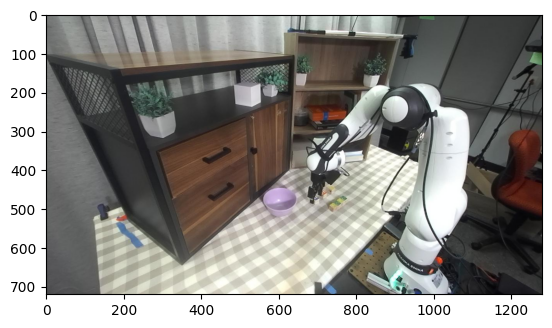

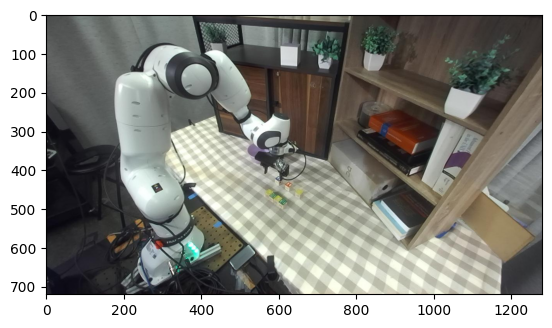

In [2]:
# load the images
im_left = cv2.imread('data/left_30.jpg')
print("image shape:", im_left.shape)
plt.imshow(im_left[:, :, ::-1])
plt.figure()
im_right = cv2.imread('data/right_30.jpg')
plt.imshow(im_right[:, :, ::-1])
images = [im_left, im_right]


Images undistorted with K =
[[967.   0. 640.]
 [  0. 967. 360.]
 [  0.   0.   1.]]
dist_coeffs: [-0.  0.  0.  0.  0.]


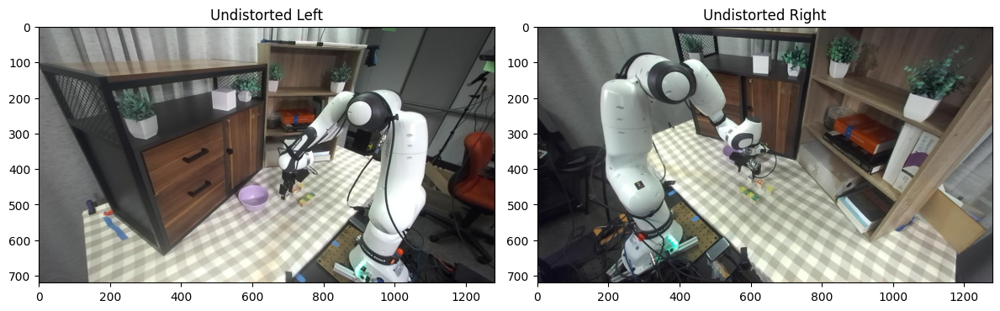

In [3]:
f1 = f2 = 967.0
u0 = 640.0         
v0 = 360.0        

K = np.array([[f1, 0, u0],
              [0, f2, v0],
              [0, 0,  1 ]])

dist_coeffs = np.array([-0.0, 0.0, 0.0, 0.0, 0.0])

# ── Undistort before SIFT ───────────────────────────────────────────────────
# This is the most important step for accurate epipolar geometry.
# The 8-point algorithm assumes a pinhole model; distortion violates it.
images[0] = cv2.undistort(images[0], K, dist_coeffs)
images[1] = cv2.undistort(images[1], K, dist_coeffs)

print("Images undistorted with K =")
print(K)
print("dist_coeffs:", dist_coeffs)

plt.figure(figsize=(12, 4))
plt.subplot(1,2,1); plt.title("Undistorted Left");  plt.imshow(images[0][:,:,::-1])
plt.subplot(1,2,2); plt.title("Undistorted Right"); plt.imshow(images[1][:,:,::-1])
plt.tight_layout()


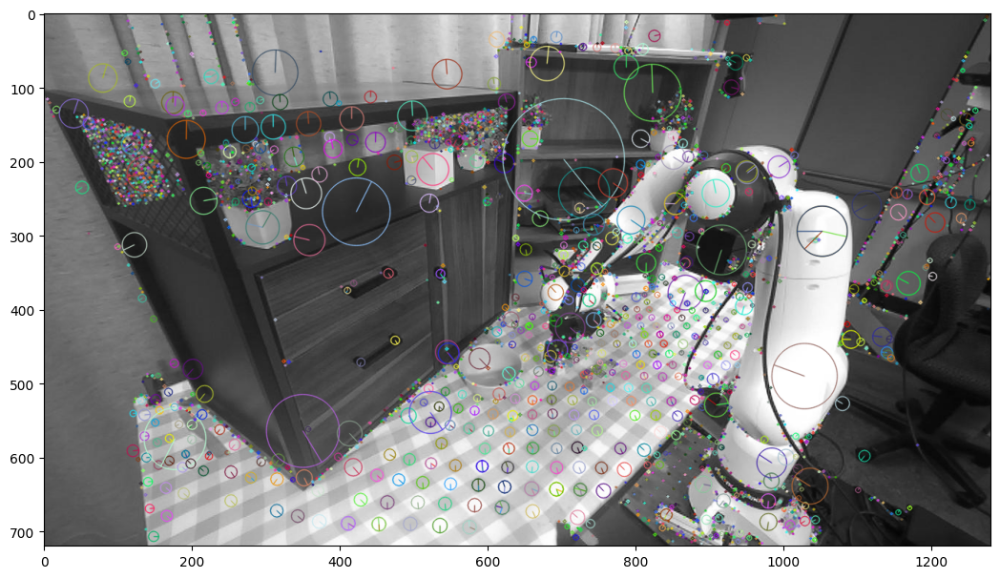

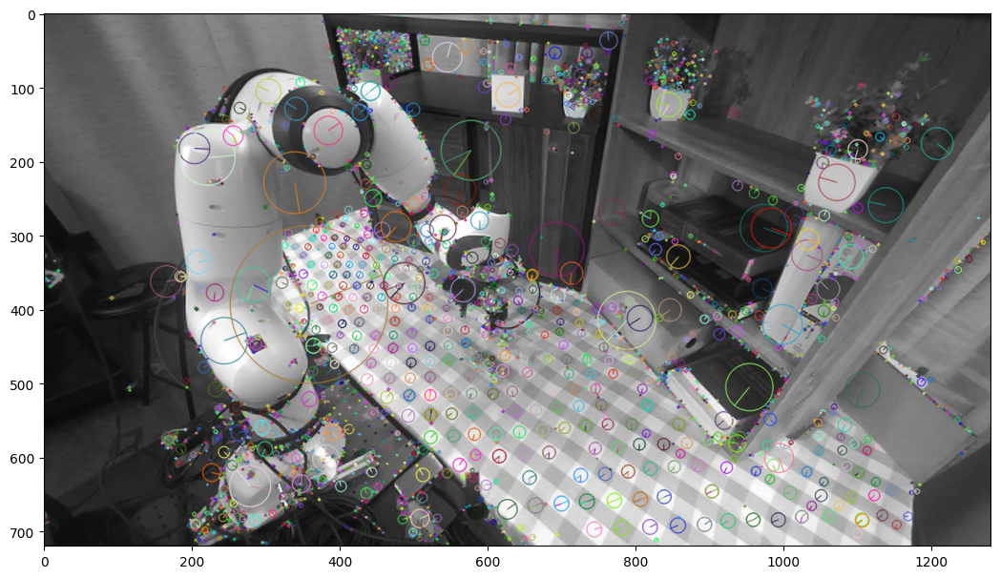

In [4]:
""" Detects SIFT features in all of the images
"""
keypoints = []
descriptions = []
for im in images:
  gray= cv2.cvtColor(im,cv2.COLOR_RGB2GRAY)

  sift = cv2.SIFT_create()
  kp, des = sift.detectAndCompute(gray,None)

  keypoints.append(kp)
  descriptions.append(des)

  plt.figure(figsize=(6.4*2, 4.8*2))
  out_im = cv2.drawKeypoints(gray,kp, gray, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  plt.imshow(out_im)
  plt.savefig('result/sift_keypoints_{}.png'.format(len(keypoints)), bbox_inches='tight', dpi=150)

num matches 788


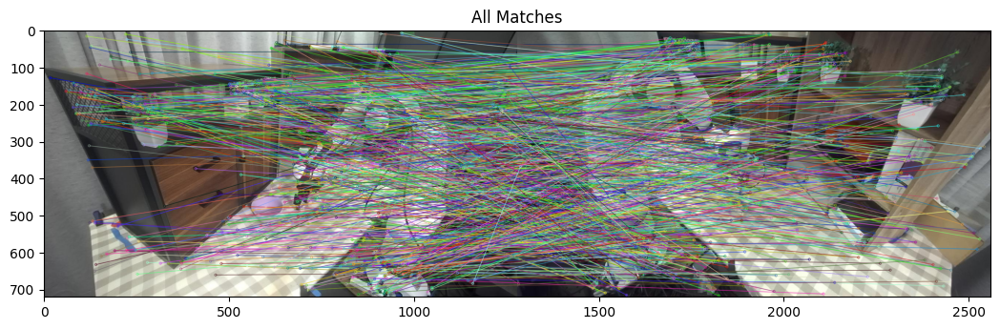

In [5]:
""" Matches the detected keypoints between the images
"""

bf = cv2.BFMatcher(crossCheck=True)
matches = bf.match(descriptions[0], descriptions[1])

print("num matches", len(matches))

matched_image = cv2.drawMatches(images[0][:, :, ::-1], keypoints[0], images[1][:, :, ::-1], keypoints[1], matches, None, flags=2)
plt.figure(figsize=(6.4*2, 4.8*2))
plt.title("All Matches")
plt.imshow(matched_image)


In [6]:

""" Compute calibrated coordinates
K is already defined in the calibration cell above.
"""
uncalibrated_1 = [[keypoints[0][match.queryIdx].pt[0], keypoints[0][match.queryIdx].pt[1], 1] for match in matches]
uncalibrated_2 = [[keypoints[1][match.trainIdx].pt[0], keypoints[1][match.trainIdx].pt[1], 1] for match in matches]

uncalibrated_1 = np.array(uncalibrated_1).T
uncalibrated_2 = np.array(uncalibrated_2).T

k_inv = np.linalg.inv(K)

calibrated_1 = np.matmul(k_inv, uncalibrated_1).T
calibrated_2 = np.matmul(k_inv, uncalibrated_2).T


In [7]:
""" Compute calibrated coordinates
"""

# ZED Camera Intrinsic Parameters
f1 = f2 = 967.0
u0 = 640.00
v0 = 360.00

K = np.array([[f1, 0, u0],
              [0, f2, v0],
              [0, 0,  1]])

# Distortion coefficients [k1, k2, p1, p2, k3]
dist_coeffs = np.array([0.000000, 0.000000, 
                        0.000000, 0.000000, 
                        0.000000])


uncalibrated_1 = [[keypoints[0][match.queryIdx].pt[0], keypoints[0][match.queryIdx].pt[1], 1] for match in matches]
uncalibrated_2 = [[keypoints[1][match.trainIdx].pt[0], keypoints[1][match.trainIdx].pt[1], 1] for match in matches]

uncalibrated_1 = np.array(uncalibrated_1).T
uncalibrated_2 = np.array(uncalibrated_2).T

k_inv = np.linalg.inv(K)

calibrated_1 = np.matmul(k_inv, uncalibrated_1).T
calibrated_2 = np.matmul(k_inv, uncalibrated_2).T


Let's test your `least_squares_estimation` method.

In [8]:
from lse import least_squares_estimation

E_least = least_squares_estimation(calibrated_1, calibrated_2)
print("E least", E_least)

E least [[ 0.84593418  0.32153297 -0.3899212 ]
 [-0.31759687  0.94463698  0.07536311]
 [ 0.15696907  0.02356397 -0.06994588]]


Let's test your `ransac_estimator` method.

E_ransac [[ 0.05609851 -0.69463554 -0.20357144]
 [-0.70847578  0.01518261  0.65329548]
 [-0.22248454 -0.7013388   0.05053882]]
Num inliers (51,)


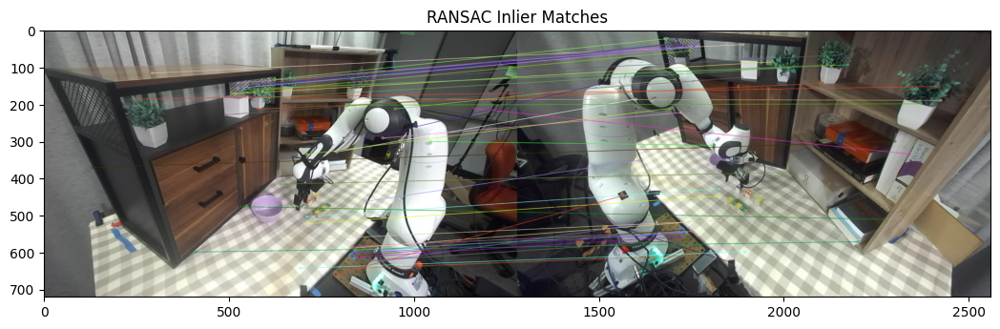

In [9]:
%reload_ext autoreload
%autoreload 2

from ransac import ransac_estimator

# running this cell will take a while!!!

E_ransac, inliers = ransac_estimator(calibrated_1, calibrated_2)
print("E_ransac", E_ransac)
print("Num inliers", inliers.shape)

inlier_matches = [matches[i] for i in inliers]

matched_image = cv2.drawMatches(images[0][:, :, ::-1],
                                keypoints[0],
                                images[1][:, :, ::-1],
                                keypoints[1],
                                inlier_matches, None, flags=2)
plt.figure(figsize=(6.4*2, 4.8*2))
plt.title("RANSAC Inlier Matches")
plt.imshow(matched_image)
plt.savefig('result/ransac_inlier_matches.png', bbox_inches='tight', dpi=150)

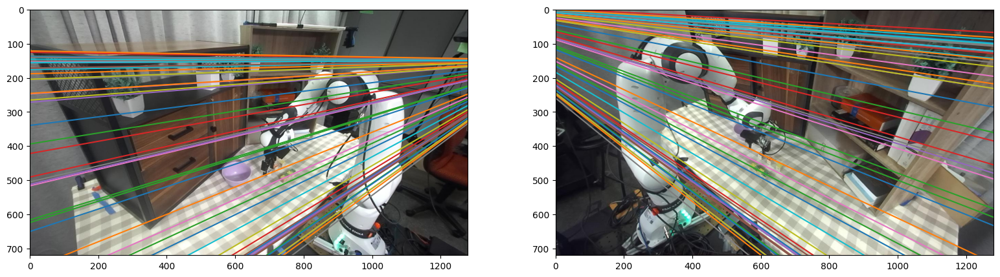

In [10]:

from plot_epi import plot_epipolar_lines

uncalibrated_inliers_1 = [[keypoints[0][match.queryIdx].pt[0], keypoints[0][match.queryIdx].pt[1], 1] for match in inlier_matches]
uncalibrated_inliers_2 = [[keypoints[1][match.trainIdx].pt[0], keypoints[1][match.trainIdx].pt[1], 1] for match in inlier_matches]
uncalibrated_inliers_1 = np.array(uncalibrated_inliers_1).T
uncalibrated_inliers_2 = np.array(uncalibrated_inliers_2).T

plot_epipolar_lines(images[0], images[1], uncalibrated_inliers_1, uncalibrated_inliers_2, E_ransac, K)
plt.savefig('result/epipolar_lines.png', bbox_inches='tight', dpi=150)


Let's test your `pose_candidates_from_E` method.

In [11]:
from pose import pose_candidates_from_E

transform_candidates = pose_candidates_from_E(E_ransac)
print("transform_candidates", transform_candidates)
for c in transform_candidates:
  print(np.linalg.det(c['R']))

np.array([[0, -1, 0], [1, 0, 0], [0, 0, 1]]).T

transform_candidates [{'T': array([-0.68767222, -0.26652687,  0.6753298 ]), 'R': array([[-0.07880413, -0.28621498,  0.95491931],
       [ 0.29299006,  0.90894295,  0.29661345],
       [-0.95286239,  0.30315623,  0.01222968]])}, {'T': array([-0.68767222, -0.26652687,  0.6753298 ]), 'R': array([[ 0.9967017 ,  0.06712975,  0.04559959],
       [ 0.06276717, -0.99385564,  0.09116602],
       [ 0.05143936, -0.08800317, -0.99479115]])}, {'T': array([ 0.68767222,  0.26652687, -0.6753298 ]), 'R': array([[-0.07880413, -0.28621498,  0.95491931],
       [ 0.29299006,  0.90894295,  0.29661345],
       [-0.95286239,  0.30315623,  0.01222968]])}, {'T': array([ 0.68767222,  0.26652687, -0.6753298 ]), 'R': array([[ 0.9967017 ,  0.06712975,  0.04559959],
       [ 0.06276717, -0.99385564,  0.09116602],
       [ 0.05143936, -0.08800317, -0.99479115]])}]
1.0000000000000009
1.0000000000000007
1.0000000000000009
1.0000000000000007


array([[ 0,  1,  0],
       [-1,  0,  0],
       [ 0,  0,  1]])

In [12]:
def plot_reconstruction(P1, P2, T, R):
  P1trans = (R @ P1.T).T + T

  plt.figure(figsize=(6.4*2, 4.8*2))
  ax = plt.axes()
  ax.set_xlabel('x')
  ax.set_ylabel('z')

  for i in range(P1.shape[0]):
    plt.plot([0, P2[i, 0]], [0, P2[i, 2]], 'bs-')
    plt.plot([T[0], P1trans[i, 0]], [T[2], P1trans[i, 2]], 'ro-')
  plt.plot([0], [0], 'bs')
  plt.plot([T[0]], [T[2]], 'ro')
  plt.savefig('result/reconstruction.png', bbox_inches='tight', dpi=150)

Let's test your `reconstruct3D` method.

best 788 (788,)
not best 67
not best 0
not best 0


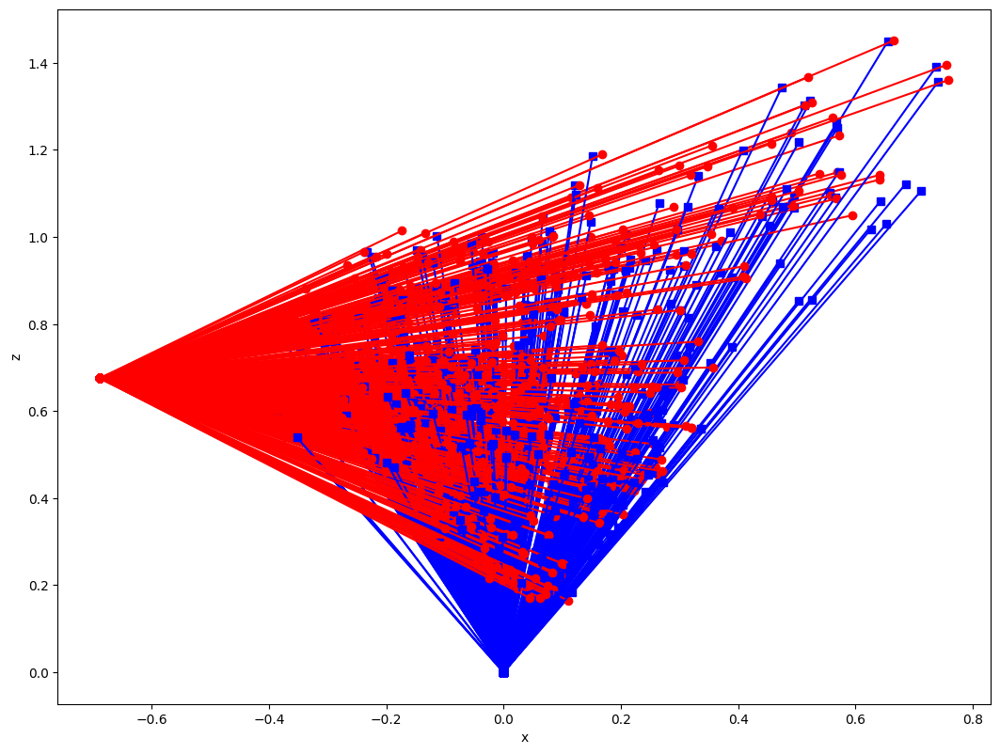

In [13]:
from recon3d import reconstruct3D 

P1, P2, T, R = reconstruct3D(transform_candidates, calibrated_1, calibrated_2)

plot_reconstruction(P1, P2, T, R)

Let's test your `show_reprojections` method. This will display the reprojections on the two images.

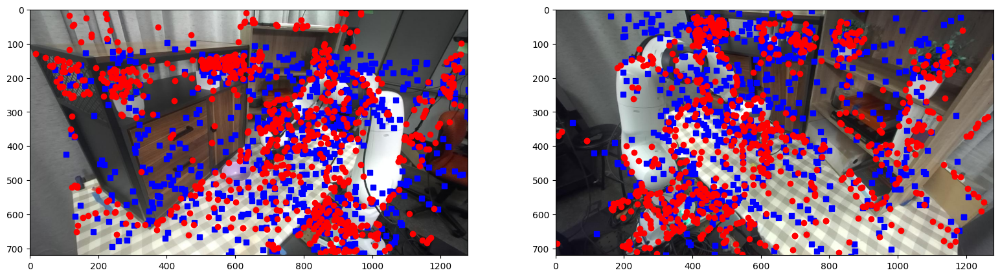

In [14]:
from show_reproj import show_reprojections

show_reprojections(images[0], images[1], uncalibrated_1, uncalibrated_2, P1, P2, K, T, R)

## Interactive Visualizer

We've provided an interactive Gradio-based visualizer that lets you explore the full 3D reconstruction pipeline in real-time.

**To launch the visualizer:**
1. Open a terminal and navigate to `Homework_3/code/`
2. Run: `python visualizer.py`
3. Open your browser to: `http://localhost:7860`

**Features:**
- **Feature Matching**: Adjust `max_matches` to control how many top SIFT matches are used
- **RANSAC**: Tune the Sampson distance threshold (ε) and number of iterations
- **Epipolar Lines**: Visualize epipolar geometry with adjustable line count and sampling
- **Pose Selection**: Override automatic pose candidate selection or let the algorithm choose
- **Real-time Updates**: All visualizations update instantly when you adjust any parameter

**Outputs:**
- Feature matches with inlier count
- Epipolar lines overlaid on both images
- 3D scatter plot of reconstructed points and camera positions
- Reprojection comparison (original detections vs. reprojected points)
- Statistics panel showing RANSAC inliers, RMSE, rotation matrix determinant, and essential matrices

## Extension: VGGT (Visual Geometry Grounded Transformer)

### Overview
[*VGGT** (Visual Geometry Grounded Transformer)](https://vgg-t.github.io/) is the **CVPR 2025 Best Paper** award winner and represents the current **state-of-the-art (SOTA)** in 3D scene reconstruction. Unlike the classical two-view reconstruction pipeline implemented in this homework (SIFT + RANSAC + Essential Matrix decomposition), VGGT leverages transformer-based architectures with learned Gaussian representations for multi-view 3D reconstruction.

### Key Innovations
- **Transformer-Based Architecture**: Replaces traditional geometric pipelines with learned attention mechanisms
- **3D Gaussian Splatting**: Uses differentiable 3D Gaussians for scene representation, enabling faster rendering and higher quality reconstruction
- **End-to-End Learning**: Learns feature matching, pose estimation, and 3D reconstruction jointly
- **Multi-View Fusion**: Efficiently aggregates information from multiple views beyond just two images

### Advantages Over Classical Methods
1. **Robustness**: More resilient to challenging conditions (low texture, lighting variations, occlusions)
2. **Completeness**: Produces denser and more complete 3D reconstructions
3. **Efficiency**: Faster reconstruction once trained, bypassing iterative RANSAC
4. **Quality**: Superior reconstruction quality, especially for complex scenes

### Computational Requirements
⚠️ **Notice: You may need a high-end GPU (NVIDIA RTX 4090 or A100) to run VGGT** due to:
- Large transformer models requiring substantial memory
- Real-time 3D Gaussian splatting rendering
- Training/fine-tuning on custom datasets

### Relation to This Homework
This homework implements the **classical geometric approach**:
- Feature extraction (SIFT) → Feature matching → Essential matrix estimation (8-point + RANSAC) → Pose recovery → Triangulation

VGGT **modernizes** this pipeline:
- Deep features → Learned matching → Direct pose regression → Neural 3D reconstruction

Both solve the same fundamental problem but with different philosophies: geometric vs. learning.

---

Try code here: https://github.com/facebookresearch/vggt


Below is an example result:

In [15]:
import trimesh
glb_path = "data/vggt.glb"
mesh = trimesh.load(glb_path)
mesh.show()

### Extra Question:

Your TA Tony accidentally input the wrist image into VGGT, and the reconstruction below is incorrect. Think about why and how to solve this with SfM?

![wrist](data/wrist_30.jpg)

In [16]:
glb_path = "data/vggt-with-wrist.glb"
mesh = trimesh.load(glb_path)
mesh.show()